In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras.utils import plot_model
import tensorflow as tf

# The dimensions of our input image
img_width = 180
img_height = 180
layer_names = ["conv2_block1_1_conv", "conv5_block3_3_conv"]

In [2]:
# Let's import ResNet50V2 model pre-trained
resnet_model = keras.applications.ResNet50V2(weights="imagenet", include_top=False)

resnet_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                      

In [3]:
plot_model(
    resnet_model,
    dpi=300,
    to_file="resnet.png"
)

In [4]:
# Build a ResNet50V2 model loaded with pre-trained ImageNet weights

# Let's set up a model that returns the activation values for our target layer
layers = [ resnet_model.get_layer(name=layer_name) for layer_name in layer_names]
# "conv3_block4_out"
print(layers)
feature_extractor = keras.Model(
    inputs=resnet_model.inputs, 
    outputs=[ layer.output for layer in layers ]
)

[<keras.layers.convolutional.conv2d.Conv2D object at 0x000002882783EB30>, <keras.layers.convolutional.conv2d.Conv2D object at 0x00000288289E8100>]


In [5]:
def compute_loss(input_image, level_index, filter_index):
    activation = feature_extractor(input_image)
    print(activation)
    filter_activation = activation[level_index][:, :, :, filter_index]
    return tf.reduce_mean(filter_activation)

In [6]:
# Let's implement gradient ascent to optimize the input image in order to maximize 
# the activation of a specific filter in a given layer

@tf.function
def gradient_ascent_step(img, level_index, learning_rate, filter_index):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, level_index, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

In [7]:
def initialize_image():
    # Uniform noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs to be in the range [-1, +1]
    # Let's scale the inputs to the range [-0.125, +0.125]
    return (img - 0.5) * .25


def visualize_filter(level_index, filter_index):
    # 30 steps of gradient ascent
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, level_index, learning_rate, filter_index)

    # Let's decode the image
    img = deprocess_image(img[0].numpy())
    return loss, img


def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

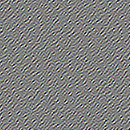

In [10]:
from IPython.display import Image, display

loss, img = visualize_filter(0, 0)
# visualize filter n. 0 at level conv2_block1_1_conv
keras.preprocessing.image.save_img("visualizations/level_start_gray.png", img)
display(Image("visualizations/level_start_gray.png"))

[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]


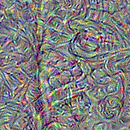

In [11]:
# from IPython.display import Image, display

loss, img = visualize_filter(1, 0)
# visualize filter n. 0 at level conv3_block4_out
tf.keras.preprocessing.image.save_img("visualizations/level_end_gray.png", img)
display(Image("visualizations/level_end_gray.png"))

Processing filter 0
Processing filter 1
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 2
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 3
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 4
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 5
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing

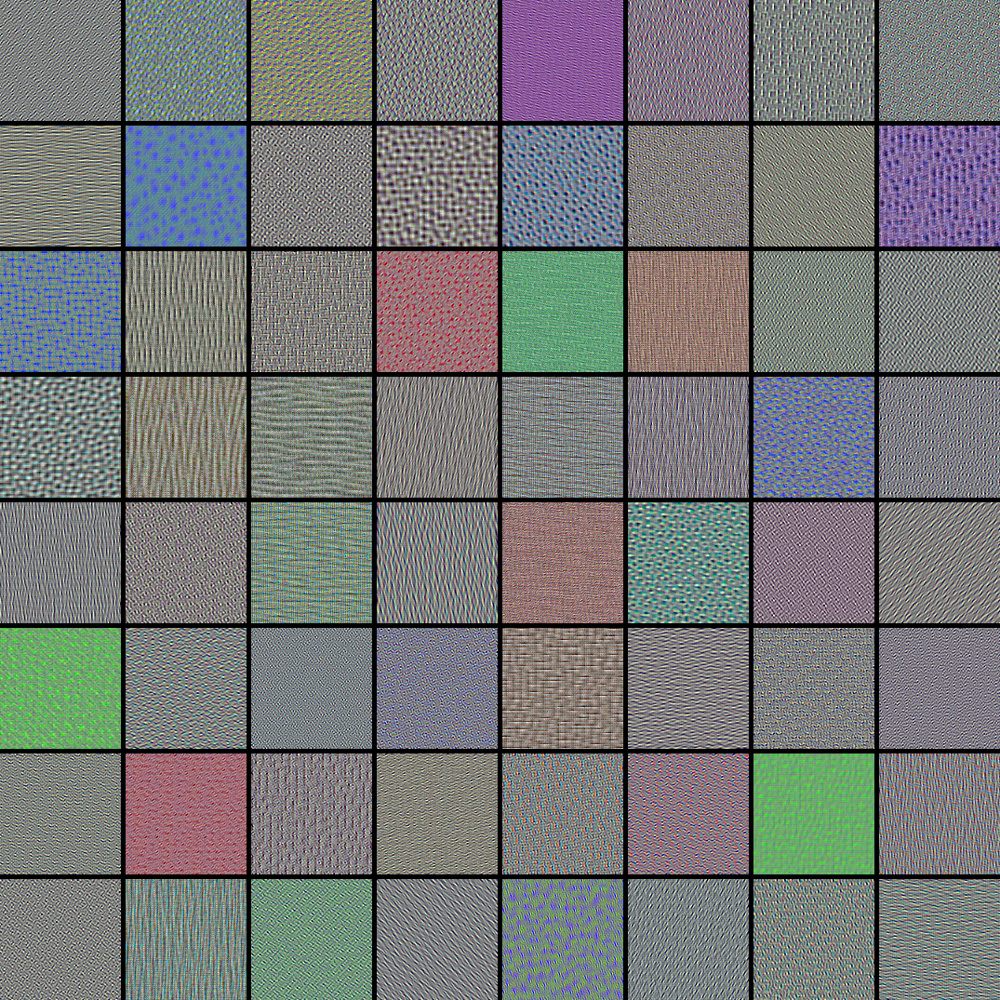

In [12]:
# Compute the images that maximize the activation of the first 64 filters of the chosen layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(0, filter_index)
    all_imgs.append(img)

# Construct an 8x8 image containing all the filters
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the 8x8 image
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img
keras.preprocessing.image.save_img("visualizations/stiched_filters_uniform_start.png", stitched_filters)

from IPython.display import Image, display

display(Image("visualizations/stiched_filters_uniform_start.png"))

Processing filter 0
Processing filter 1
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 2
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 3
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 4
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing filter 5
[<tf.Tensor 'model/conv2_block1_1_conv/Conv2D:0' shape=(1, 45, 45, 64) dtype=float32>, <tf.Tensor 'model/conv5_block3_3_conv/BiasAdd:0' shape=(1, 6, 6, 2048) dtype=float32>]
Processing

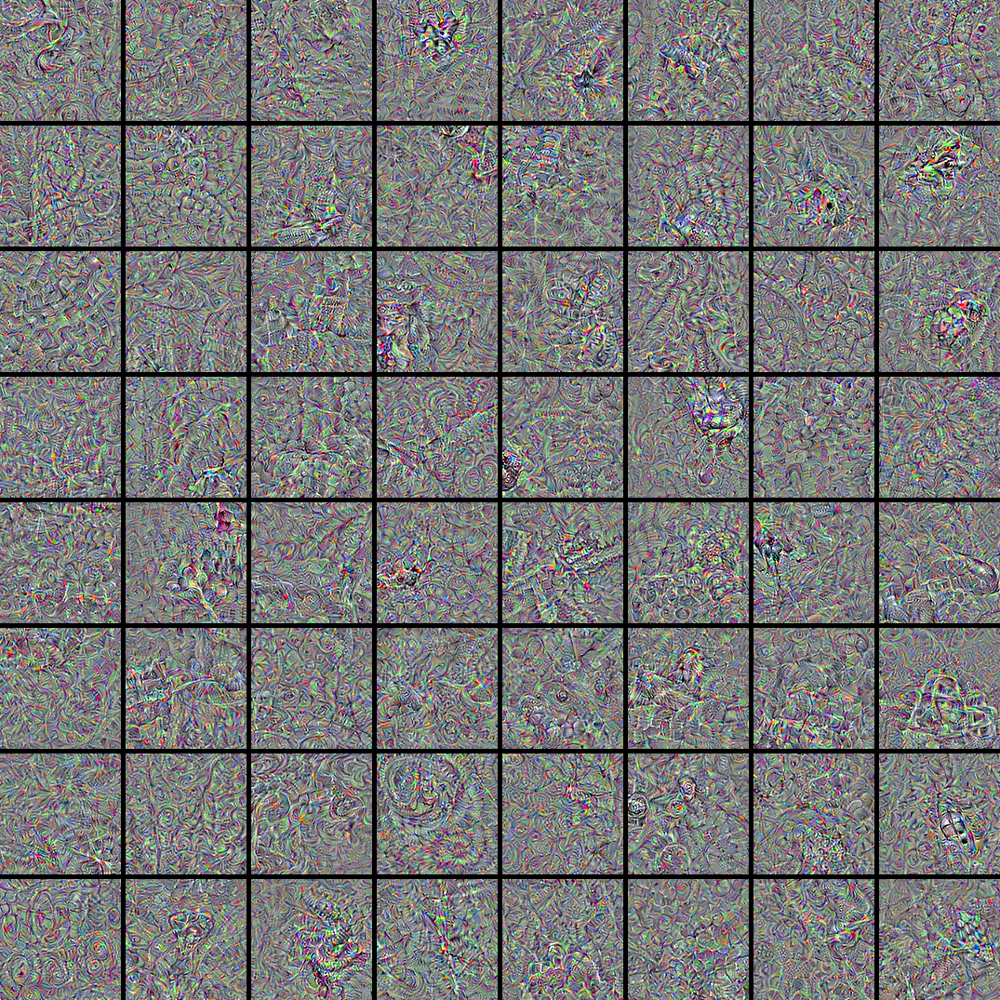

In [13]:
# Compute the images that maximize the activation of the first 64 filters of the selected layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(1, filter_index)
    all_imgs.append(img)

# Construct a composite image of 8x8 filters with dimensions 128x128, with a margin of 5 pixels
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img
keras.preprocessing.image.save_img("visualizations/stiched_filters_uniform_end.png", stitched_filters)

from IPython.display import Image, display

display(Image("visualizations/stiched_filters_uniform_end.png"))